In [1]:
import os
import cv2
import math
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import optimizers
from tensorflow.keras import losses
from tensorflow.keras import metrics
from tensorflow.keras import initializers

tf.__version__

'2.8.0'

In [2]:
# The amount of GPU memory to allocate to Tensorflow
vram = 14 # GB

gpus = tf.config.list_physical_devices('GPU')

tf.config.set_logical_device_configuration(
    gpus[0],
    [tf.config.LogicalDeviceConfiguration(memory_limit=vram*1024)])

In [3]:
def load_and_resize(image_filepath):

    '''Takes the file path for a single image and returns
    a (256 x 256 x 3) numpy array of the pixel values.'''

    image = cv2.imread(image_filepath)
    image = cv2.resize(image,(64,64))

    return image

def rgb_to_lab_split_channels(image):

    '''Takes a numpy array of RGB image pixel values, converts the
    image to the LAB color space. 
    
    Scales all the values to be between -1 and 1. Returns a 
    (Width x Height x 1) array for the L channel 
    and a combined (Width x Height x 2) array for the A and B channels.'''

    lab_image = cv2.cvtColor(image,cv2.COLOR_RGB2LAB)
    lab_image_adj = np.add(lab_image,-128)/128

    l_channel = np.expand_dims(lab_image_adj[:,:,0],2)
    ab_channels = lab_image_adj[:,:,1:]

    return l_channel, ab_channels

def lab_to_rgb_combine_channels(l_channel,ab_channels):

    '''Takes numpy arrays for the l and ab channels of one image. All values in the
    input arrays should be in the range -1 to 1 and the arrays should be
    (Width x Height x 1) for l and (Width x Height x 2) for ab.
    
    Scales the input arrays to have values between 0 and 255. Combines the
    channels into a single image and converts the image to the RGB color space.
    Returns the RGB image.''' 

    a_channel = ab_channels[:,:,0]
    b_channel = ab_channels[:,:,1]

    recombined = np.dstack([l_channel,a_channel,b_channel])
    recombined = np.add(recombined*128,128)
    converted = cv2.cvtColor(recombined.astype(np.uint8),cv2.COLOR_LAB2RGB)

    return converted

In [4]:
class data_loader(keras.utils.Sequence):

    '''Generator to load and preprocess images for the model. I had to hard
    code the training image directory because calling tf.data.Dataset.from_generator()
    with the directory in the args parameter changes the dtypes and causes a bunch
    of errors. The __init__ still takes arguments so I can use this class to load the
    testing images as well.
    
    This is used isnstead of tf.data.Dataset.from_tensor_slices() because the dataset
    does not fit in memory.'''

    def __init__(self,directory='../images/train_images/',batch_size=256):

        self.file_paths = [directory + file_name for file_name in os.listdir(directory)]
        self.batch_size = batch_size

    def __len__(self):

        return math.ceil(len(self.file_paths)/self.batch_size)

    def __getitem__(self,idx):

        # Generates a list of file names for the batch at idx
        file_batch = self.file_paths[idx * self.batch_size: (idx+1) * self.batch_size]

        # Creates a list of numpy arrays containing batch size amount of (256x256) images
        image_batch = [load_and_resize(image_filepath) for image_filepath in file_batch]

        # Creates a list of tuples representing images
        # Index 0 contains the l (grayscale) channel for each image
        # Index 1 contains the a and b (color) channels for each image
        lab_converted_batch = [rgb_to_lab_split_channels(image) for image in image_batch]

        l_channel = np.array([channels[0] for channels in lab_converted_batch])
        ab_channels = np.array([channels[1] for channels in lab_converted_batch])

        return l_channel, ab_channels

# Create a dataset from the data_loader generator
train_dataset = tf.data.Dataset.from_generator(
    data_loader,
    output_types=(tf.float32,tf.float32)
    
    # using args=(directory,batch_size) results in an
    # error related to dtypes so the train image
    # directory and train batch size are hard coded
    # into the data_loader generator
)        

In [5]:
def downsampling(filters,stride,prev_layer):

    '''Takes number of filters and stride for the convolutional
    layer and the previous layer in the network. Adds a convolutional, 
    batch norm, and leaky relu layer after the previous layer.'''

    init = initializers.RandomNormal()

    block = layers.Conv2D(filters,strides=stride,kernel_size=4,padding='same',kernel_initializer=init,use_bias=False)(prev_layer)
    block = layers.BatchNormalization()(block)
    block = layers.LeakyReLU(0.2)(block)

    return block

def upsampling(filters,stride,prev_layer,skip_layer):

    '''Takes number of filters and stride for the convolutional layer and
    the previous layer in the network. Also takes a layer (from the downsampling
    stack) and makes a skip connection to that layer. Adds a convolutional, batch
    norm, leaky relu, and dropout layer after the previous layer.'''

    init = initializers.RandomNormal()

    block = layers.Conv2DTranspose(
        filters,strides=stride,kernel_size=4,padding='same',kernel_initializer=init,use_bias=False)(prev_layer)
    block = layers.BatchNormalization()(block)
    block = layers.Concatenate()([block,skip_layer])
    block = layers.LeakyReLU(0.2)(block)
    block = layers.Dropout(0.3)(block)

    return block

In [6]:
def make_generator():

    '''Create generator model. Generator uses a UNet architecture.
    There are 8 downsampling blocks and 8 upsampling blocks with
    skip connections between the downsampling and upsampling blocks.
    Model output is (256x256) with 2 color channels and tanh activation.'''

    init = initializers.RandomNormal()

    # Model input is a (256x256) grayscale image
    model_input = layers.Input(shape=(64,64,1))

    # Downsampling stack
    down0 = downsampling(filters=32,stride=1,prev_layer=model_input) # (64x64) -> (64x64)
    down1 = downsampling(64,2,down0) # (64x64) -> (32x32)
    down2 = downsampling(128,2,down1) # (32x32) -> (16x16)
    down3 = downsampling(256,2,down2) # (16x16) -> (8x8)
    down4 = downsampling(256,2,down3) # (8x8) -> (4x4)
    down5 = downsampling(256,2,down4) # (4x4) -> (2x2)
    down6 = downsampling(256,2,down5) # (2x2) -> (1x1)


    # Upsampling stack
    up5 = upsampling(filters=256,stride=2,prev_layer=down6,skip_layer=down5) # (1x1) -> (2x2)
    up4 = upsampling(256,2,up5,down4) # (2x2) -> (4x4)
    up3 = upsampling(256,2,up4,down3) # (4x4) -> (8x8)
    up2 = upsampling(128,2,up3,down2) # (8x8) -> (16x16)
    up1 = upsampling(64,2,up2,down1) # (16x16) -> (32x32)
    up0 = upsampling(32,2,up1,down0) # (32x32) -> (64x64)
    
    # Model output is (256x256) with 2 color channels with values between -1 and 1
    model_output = layers.Conv2DTranspose(
        2,strides=1,kernel_size=4,padding='same',activation='tanh',kernel_initializer=init,use_bias=False)(up0)

    model = keras.models.Model(model_input,model_output)
    return model

In [7]:
def generator_loss(disc_output_generated,generator_output,color_channels):

    '''Calculates generator loss from the discriminator's output
    on the generated images.'''

    cross_entropy = losses.BinaryCrossentropy(from_logits=True,label_smoothing=0.1)
    mse = losses.MeanSquaredError()
    mse_scaler = 100

    # Generator wants the discriminator to classify the generated images as 1 (real)
    # Loss is the defference between all 1s and the actual discriminator output
    adversarial_loss = cross_entropy(tf.ones_like(disc_output_generated),disc_output_generated)
    mse_loss = mse(generator_output,color_channels) 

    return adversarial_loss + (mse_scaler * mse_loss), adversarial_loss, mse_loss

In [8]:
# Create the generator and generator optimizer
generator = make_generator()
generator_optimizer = optimizers.Adam(2e-4,beta_1=0.5)

generator.summary()
#keras.utils.plot_model(generator,show_shapes=True,to_file='generator.png',dpi=48)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 1)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 64, 64, 32)   512         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 64, 64, 32)  128         ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                                  
 leaky_re_lu (LeakyReLU)        (None, 64, 64, 32)   0           ['batch_normalization[0][0]']

In [9]:
def make_discriminator():

    '''Create discriminator model. Discrimintor takes two inputs:
    one (256x256) channel representing the grayscale part of the
    image, and two (256x256) channels representing the color part
    of the image. It returns a (32x32) array of logits which 
    predict whether a patch of the image is real or generated.'''

    init = initializers.RandomNormal()

    gray_input = layers.Input(shape=(64,64,1))
    color_input = layers.Input(shape=(64,64,2))

    # Gray and colored inputs are combined
    concat_input = layers.concatenate([gray_input,color_input])

    # Downsampling to (32x32)
    down0 = downsampling(64,2,concat_input) # (64x64) -> (32x32)
    down1 = downsampling(128,2,down0)        # (32x32) -> (16x16)
    down2 = downsampling(256,2,down1)        # (16x16) -> (8x8)
    down3 = downsampling(256,2,down1)        # (8x8) -> (4x4)

    # Model output is (32x32) with unbounded values (no activation)
    model_output = layers.Conv2D(1,2,strides=1,padding='same',kernel_initializer=init,use_bias=False)(down3)

    model = keras.Model(inputs=[gray_input,color_input],outputs=model_output)
    return model

In [10]:
def discriminator_loss(disc_output_generated,disc_output_real):

    '''Calculates discriminator loss from the discriminator output
    on real and generated images.'''

    cross_entropy = losses.BinaryCrossentropy(from_logits=True,label_smoothing=0.1)

    # Discriminator wants to classify real images as 1 and generated
    # images as 0. Loss is the difference between the desired outputs
    # and the actual outputs
    real_loss = cross_entropy(tf.ones_like(disc_output_real),disc_output_real)
    generated_loss = cross_entropy(tf.zeros_like(disc_output_generated),disc_output_generated)

    total_loss = real_loss + generated_loss
    return total_loss

In [11]:
# Make the discriminator and discriminator optimizer
discriminator = make_discriminator()
discriminator_optimizer = optimizers.Adam(2e-4)

discriminator.summary()
#keras.utils.plot_model(discriminator,show_shapes=True,to_file='discriminator.png',dpi=48)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 64, 64, 1)]  0           []                               
                                                                                                  
 input_3 (InputLayer)           [(None, 64, 64, 2)]  0           []                               
                                                                                                  
 concatenate_6 (Concatenate)    (None, 64, 64, 3)    0           ['input_2[0][0]',                
                                                                  'input_3[0][0]']                
                                                                                                  
 conv2d_7 (Conv2D)              (None, 32, 32, 64)   3072        ['concatenate_6[0][0]']    

In [12]:
# Directory for tensorboard logs
log_directory = 'logs/'

# Set up tensorboard logging for the generator and discriminator loss
summary_writer = tf.summary.create_file_writer(log_directory + 'colorizer/')
gen_loss_tracker = metrics.Mean('Generator_loss',dtype=tf.float32)
gen_adv_tracker = metrics.Mean('Generator_adversarial_loss',dtype=tf.float32)
gen_mse_tracker = metrics.Mean('Generator_mse_loss',dtype=tf.float32)
disc_loss_tracker = metrics.Mean('Discriminator_loss',dtype=tf.float32)

In [13]:
@tf.function
def train_step(gray_channel,color_channels):

    '''Loop to train the generator and discriminator. Takes array
    of (256x256x1) gray images and array of (256x256x2) color image channels.'''

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:

        # Generate a batch of fake images
        generator_output = generator(gray_channel,training=True)

        # Get discriminator output on real and generated images
        disc_output_real = discriminator([gray_channel,color_channels],training=True)
        disc_output_generated = discriminator([gray_channel,generator_output],training=True)

        # Calculate loss for generator and discriminator based on discriminator outputs
        gen_loss, adversarial_loss, mse_loss = generator_loss(disc_output_generated,generator_output,color_channels)
        disc_loss = discriminator_loss(disc_output_generated,disc_output_real)

    # Calculate generator gradients and train generator
    generator_gradients = gen_tape.gradient(gen_loss,generator.trainable_variables)
    generator_optimizer.apply_gradients(zip(generator_gradients,generator.trainable_variables))

    # Calculate disciminator gradients and train discriminator
    discriminator_gradients = disc_tape.gradient(disc_loss,discriminator.trainable_variables)
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,discriminator.trainable_variables))

    # Update tensorboard losses
    gen_loss_tracker(gen_loss)
    gen_adv_tracker(adversarial_loss)
    gen_mse_tracker(mse_loss)
    disc_loss_tracker(disc_loss)

In [14]:
def display_images(generator,gray_channel,color_channels):

    generator_predictions = generator(gray_channel,training=False)

    figure, axes = plt.subplots(8,3,figsize=(10, 32))

    for index,row in enumerate(axes):
        row[0].imshow(gray_channel[index],cmap='gray')
        row[0].set_title('Gray Input',fontsize=20)

        row[1].imshow(lab_to_rgb_combine_channels(gray_channel[index],generator_predictions[index]))
        row[1].set_title('Colorized',fontsize=20)

        row[2].imshow(lab_to_rgb_combine_channels(gray_channel[index],color_channels[index]))
        row[2].set_title('Ground Truth',fontsize=20)

        for axis in row:
            axis.set_xticks([])
            axis.set_yticks([])
        figure.set_facecolor('#FFFFFF')
        figure.subplots_adjust(wspace=0.02, hspace=0)

    return(figure)

In [15]:
def train_model(epochs,dataset):
    
    step_counter = 0

    for _ in tqdm(range(epochs)):

        for gray_channel,color_channels in dataset:
            train_step(gray_channel,color_channels)

            with summary_writer.as_default():
                tf.summary.scalar('Generator_loss',gen_loss_tracker.result(),step=step_counter)
                tf.summary.scalar('Generator_adversarial_loss',gen_adv_tracker.result(),step=step_counter)
                tf.summary.scalar('Generator_mse_loss',gen_mse_tracker.result(),step=step_counter)
                tf.summary.scalar('Discriminator_loss',disc_loss_tracker.result(),step=step_counter)
            
            gen_loss_tracker.reset_states()
            gen_adv_tracker.reset_states()
            gen_mse_tracker.reset_states()
            disc_loss_tracker.reset_states()
            step_counter += 1

In [16]:
train_model(epochs=1000,dataset=train_dataset)

100%|█████████████████████████████████████| 1000/1000 [3:50:23<00:00, 13.82s/it]


<h1>Results for training set</h1>

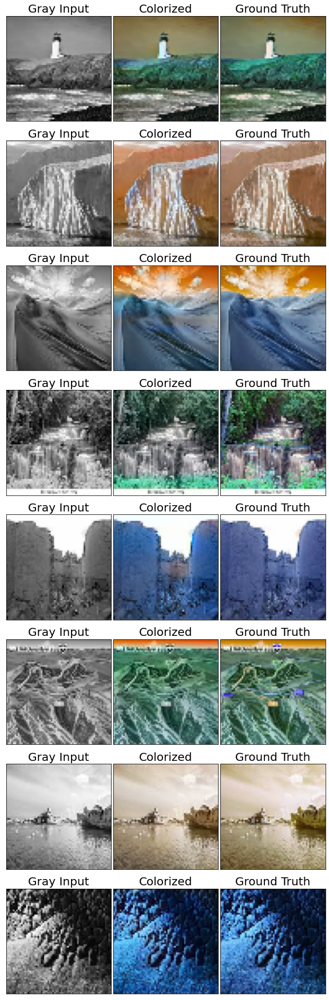

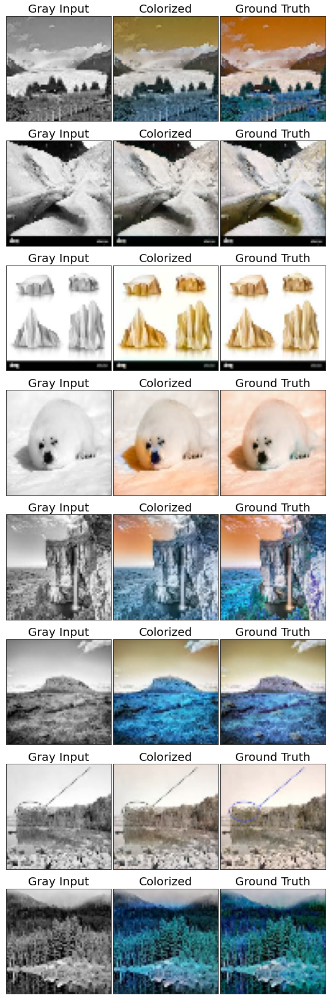

In [17]:
for train_batch in range(2):
    train_images = data_loader(directory='../images/train_images/', batch_size=8).__getitem__(train_batch)
    display_images(generator=generator,gray_channel=train_images[0],color_channels=train_images[1]);

<h1>Results for testing set</h1>

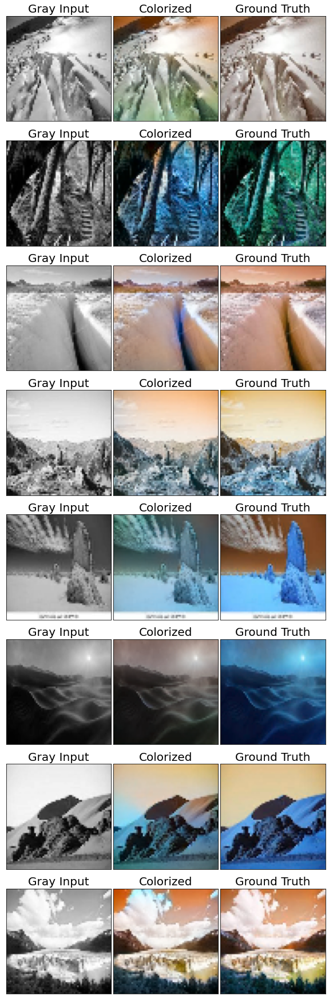

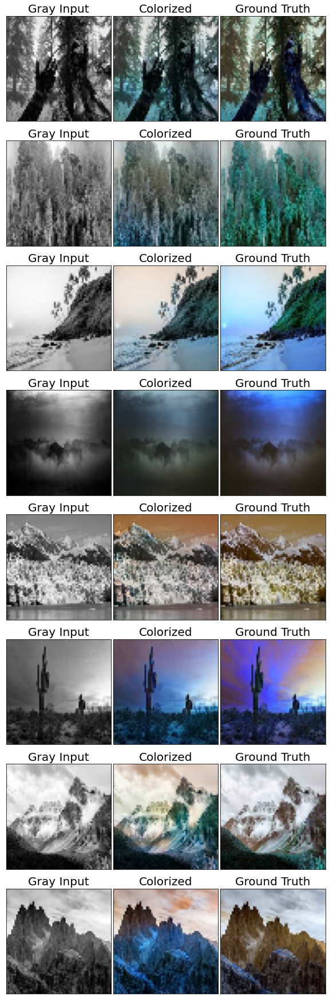

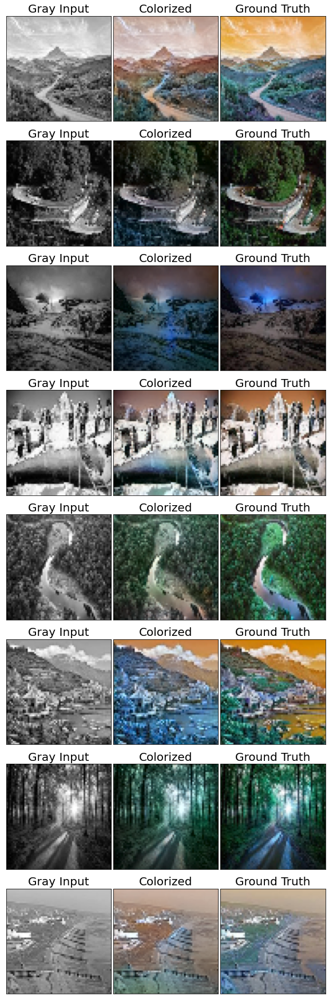

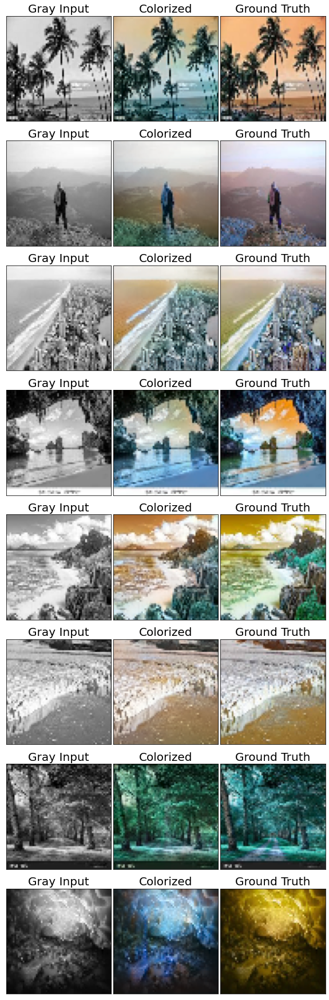

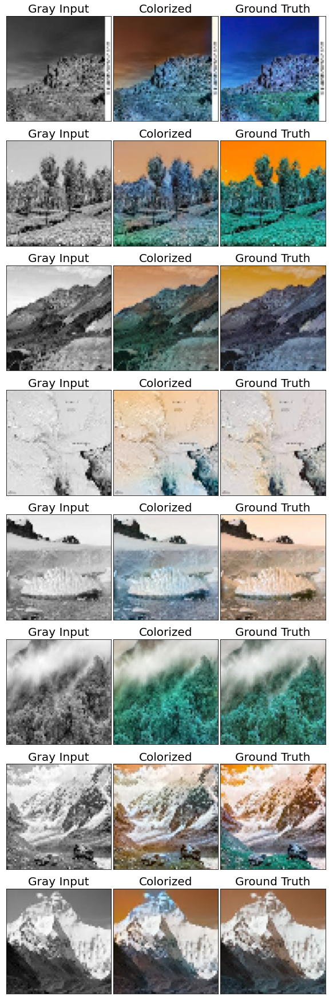

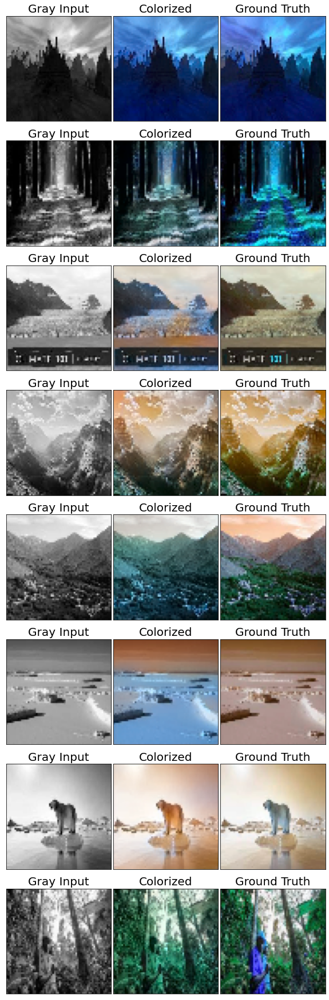

In [18]:
for test_batch in range(6):
    test_images = data_loader(directory='../images/test_images/', batch_size=8).__getitem__(test_batch)
    display_images(generator=generator,gray_channel=test_images[0],color_channels=test_images[1]);